In [2]:
# Import libraries
from PIL import Image

# Load image
image1 = Image.open('90_img_.png')
image2 = Image.open('604_img_.png')
image3 = Image.open('704_img_.png')
image4 = Image.open('858_img_.png')
image5 = Image.open('906_img_.png')

## Analyzing the image by plotting the histograms

In [3]:
from matplotlib import pyplot as plt
def plot_histogram(image):
    imageR, imageG, imageB = image.split()
    plt.figure(figsize = (10, 10))
    plt.subplot(2, 1, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.subplot(2, 1, 2)
    plt.title("Histogram of image")
    plt.plot(imageR.histogram(), color='red') 
    plt.plot(imageG.histogram(), color='green')
    plt.plot(imageB.histogram(), color='blue')
    plt.show()

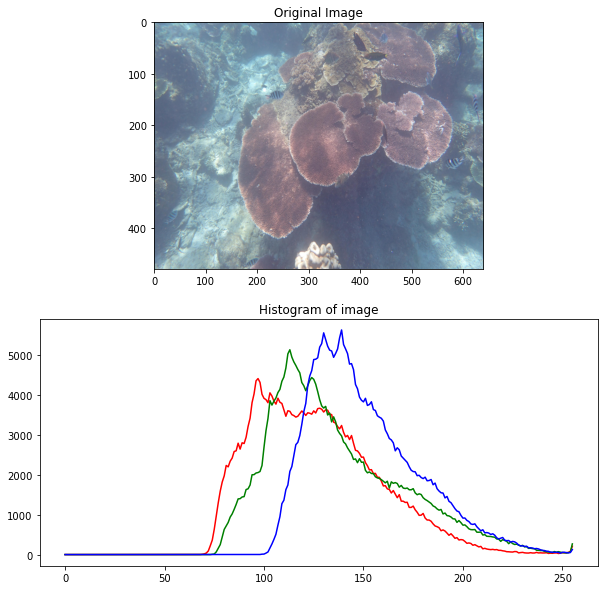

In [4]:
plot_histogram(image1)

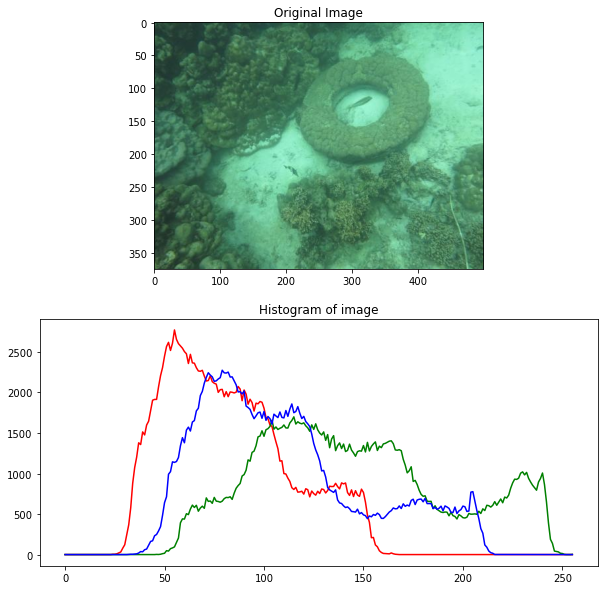

In [5]:
plot_histogram(image2)

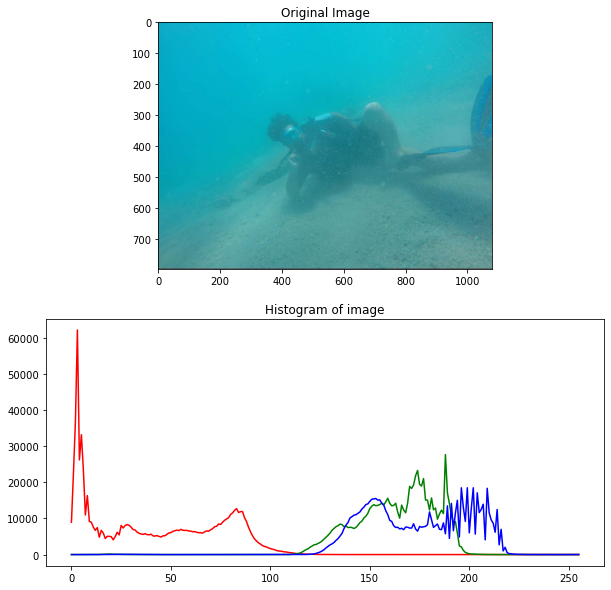

In [6]:
plot_histogram(image3)

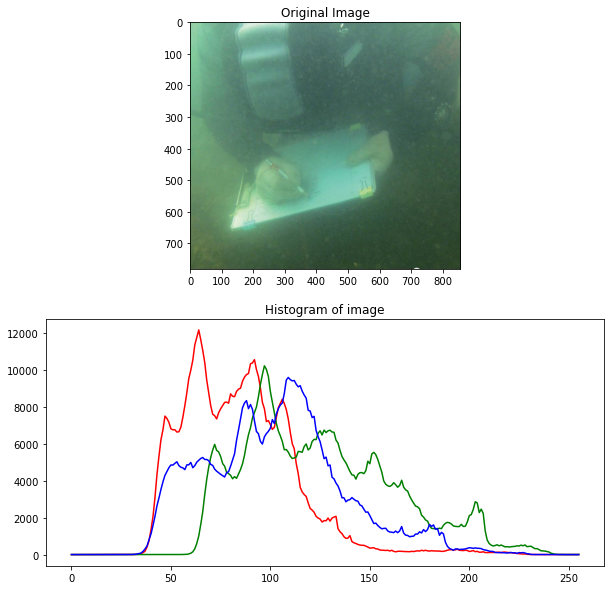

In [7]:
plot_histogram(image4)

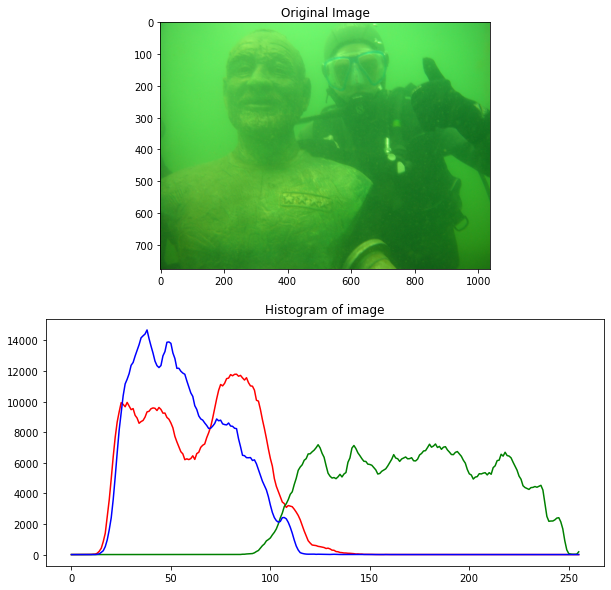

In [8]:
plot_histogram(image5)

## Perform Gaussian smoothing 

In [9]:
from PIL import ImageFilter
def gaussian_smoothing(image):
    smoothed_image = image.filter(ImageFilter.GaussianBlur)
    
    return smoothed_image

In [10]:
smoothed_image1 = gaussian_smoothing(image1)
smoothed_image2 = gaussian_smoothing(image2)
smoothed_image3 = gaussian_smoothing(image3)
smoothed_image4 = gaussian_smoothing(image4)
smoothed_image5 = gaussian_smoothing(image5)

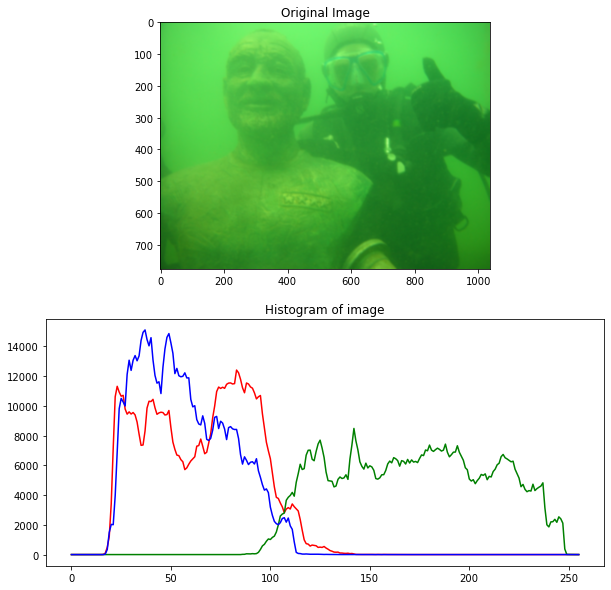

In [11]:
plot_histogram(smoothed_image5)

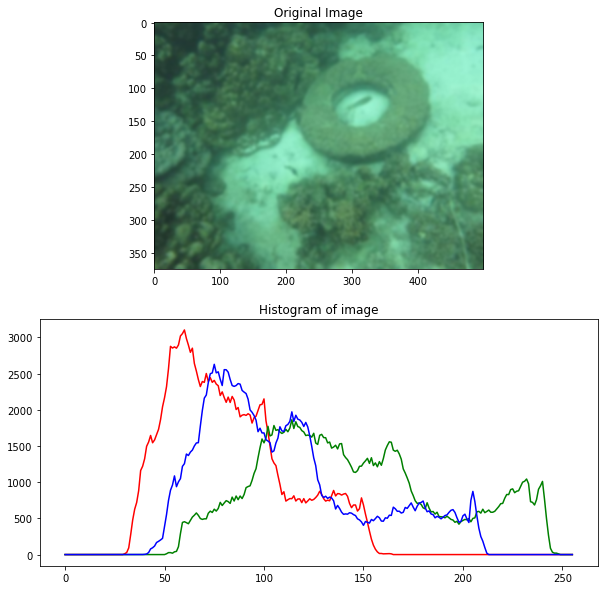

In [12]:
plot_histogram(smoothed_image2)

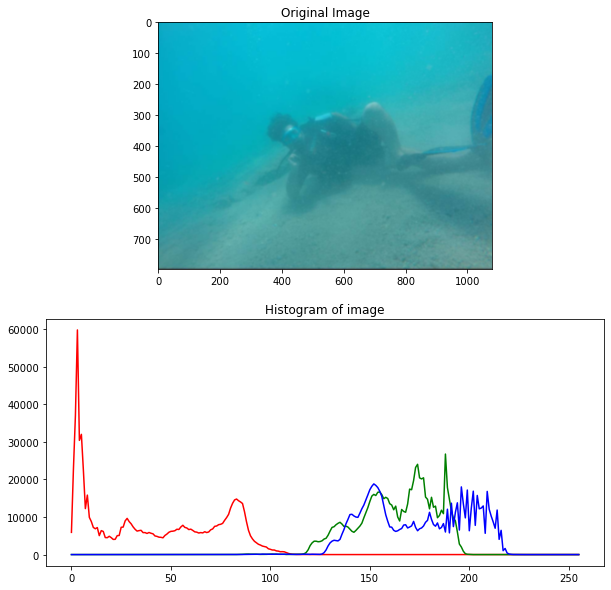

In [13]:
plot_histogram(smoothed_image3)

## Histogram equalization

In [14]:
from PIL import ImageOps
import numpy as np
def histogram_equalization(image):
    imageR, imageG, imageB = image.split()
    er = ImageOps.equalize(imageR, mask = None)
    eg = ImageOps.equalize(imageG, mask = None)
    eb = ImageOps.equalize(imageB, mask = None)
    x, y = image.size
    equalIm = np.zeros((y, x, 3), dtype = "uint8")
    equalIm[:, :, 0]=er;
    equalIm[:, :, 1]=eg;
    equalIm[:, :, 2]=eb;
    
    plt.figure(figsize = (20, 20))
    
    plt.subplot(2, 2, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.subplot(2, 2, 2)
    plt.imshow(equalIm)
    
    plt.subplot(2, 3, 4)
    plt.title("Histogram of image")
    plt.plot(er.histogram(), color='red') 
    plt.subplot(2, 3, 5)

    plt.plot(eg.histogram(), color='green')
    plt.subplot(2, 3, 6)

    plt.plot(eb.histogram(), color='blue')
    plt.show()

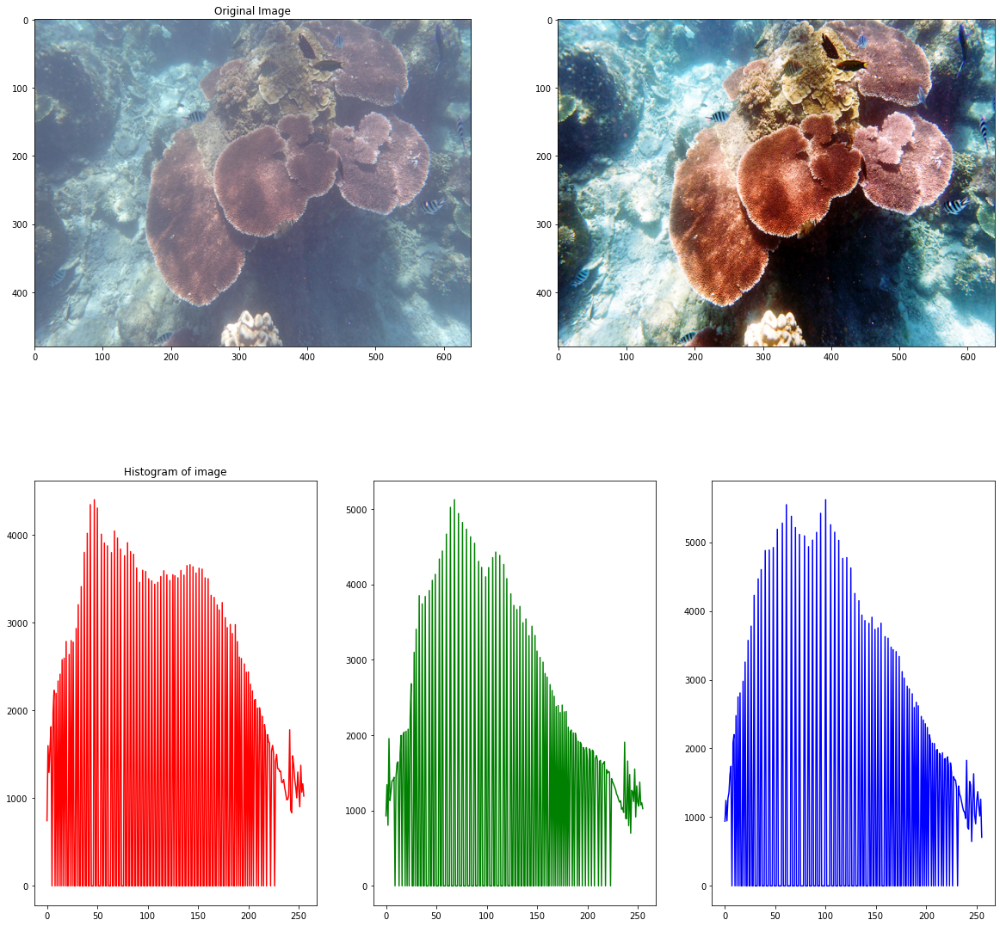

In [15]:
histogram_equalization(image1)

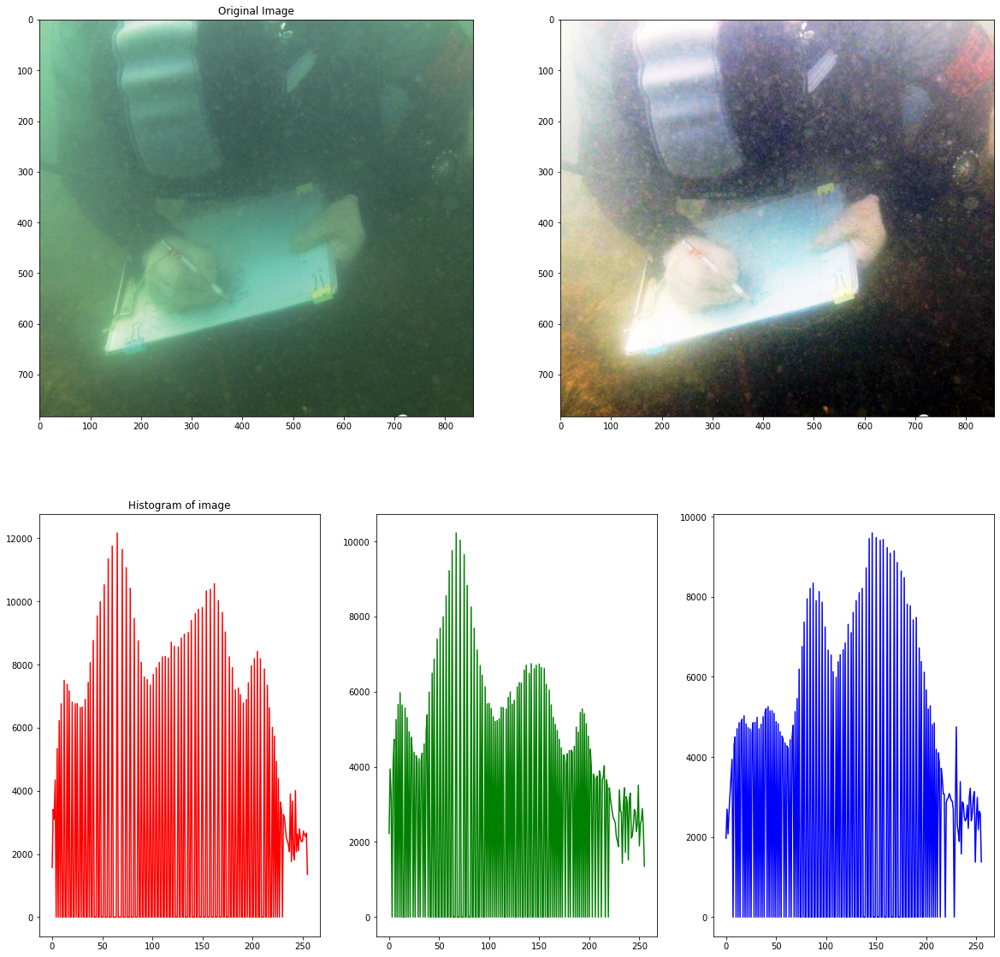

In [16]:
histogram_equalization(image4)

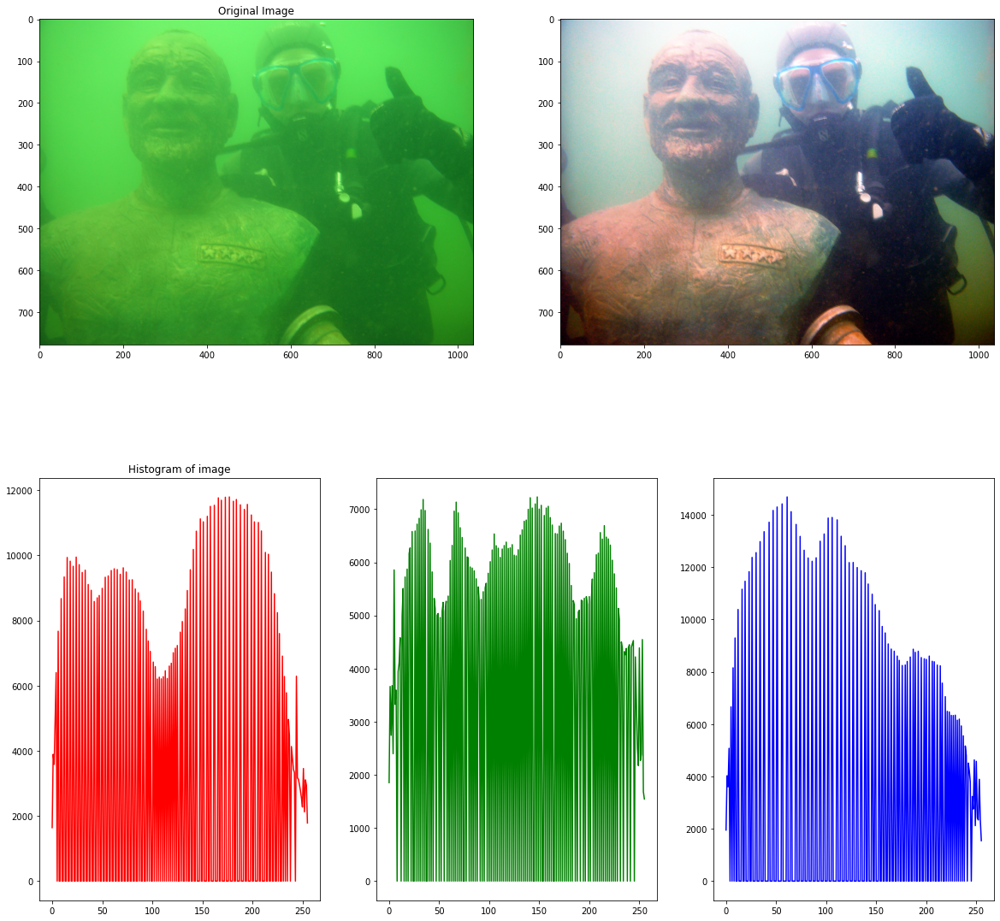

In [17]:
histogram_equalization(image5)

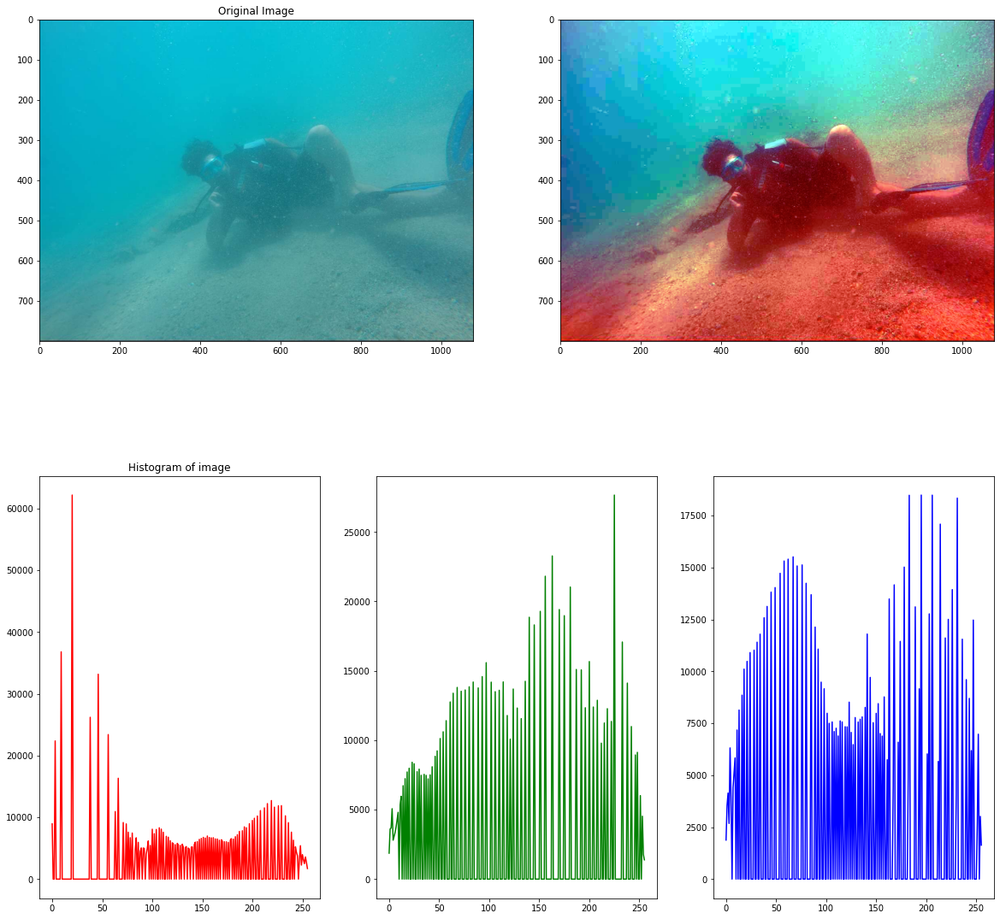

In [18]:
histogram_equalization(image3)

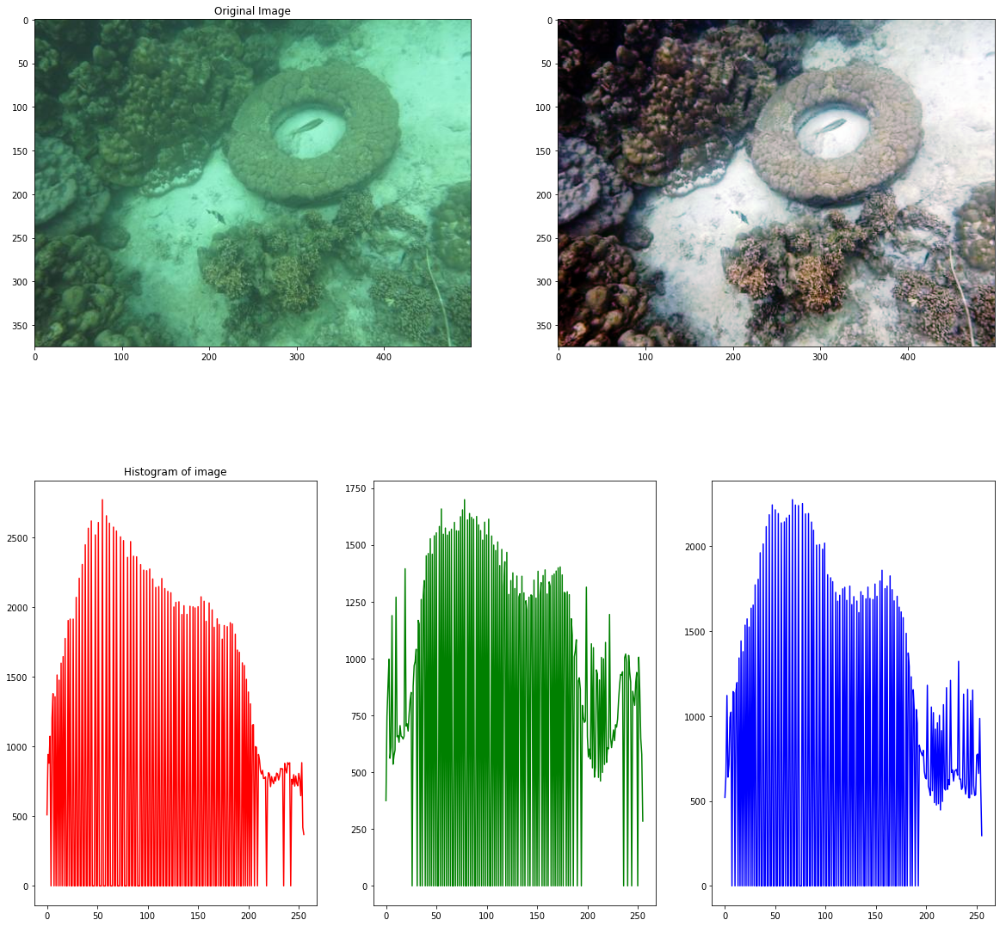

In [19]:
histogram_equalization(image2)

## Gamma Correction

In [29]:
import numpy as np
def gamma_correction(image, gamma):
    imageR, imageG, imageB = image.split()
    x, y = image.size
    
    for i in range(x):
        for j in range(y):
            pixel=imageR.getpixel((i, j))
            pixel=pixel**gamma
            imageR.putpixel((i, j), pixel)
            
            
            pixel=imageG.getpixel((i, j))
            pixel=pixel**gamma
            imageG.putpixel((i, j), pixel)
            
            pixel=imageB.getpixel((i, j))
            pixel=pixel**gamma
            imageB.putpixel((i, j), pixel)
            
    gammaIm = np.zeros((y, x, 3), dtype = "uint8")
    gammaIm[:, :, 0]=imageR
    gammaIm[:, :, 1]=imageG
    gammaIm[:, :, 2]=imageB
    
    plt.figure(figsize = (20, 20))
    
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.subplot(1, 2, 2)
    plt.imshow(gammaIm)
    plt.show()

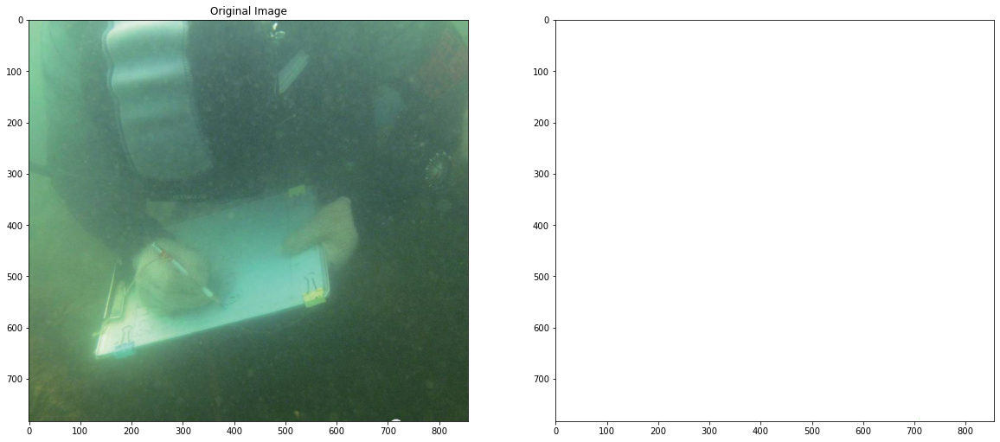

In [41]:
gamma_correction(image4, 2)

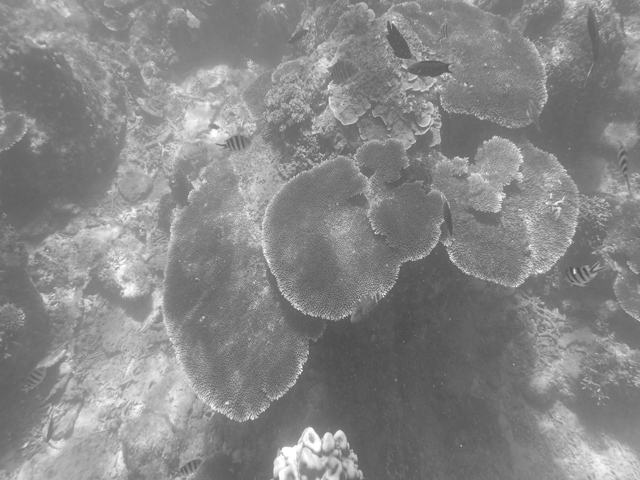

In [51]:
imageG1=image1.convert('L')
imageG1

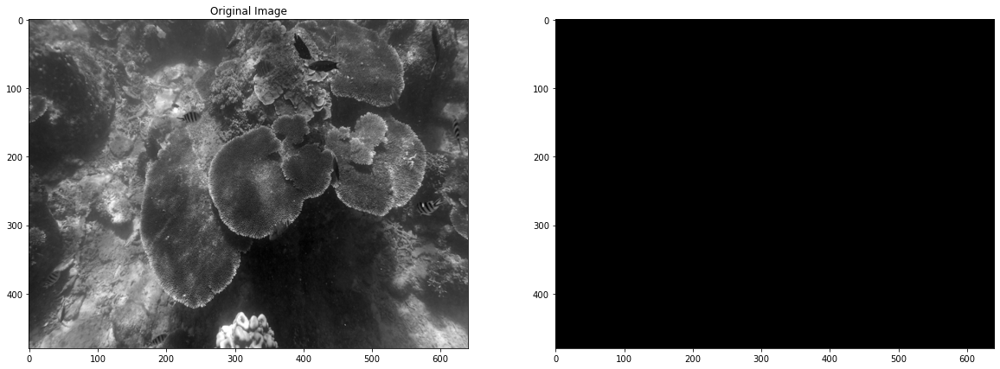

In [52]:
x, y = imageG1.size
plt.figure(figsize = (20, 20))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(imageG1, cmap='gray') 
for i in range(x):
    for j in range(y):
        pixel=imageG1.getpixel((i, j))
        pixel=pixel**3
        imageG1.putpixel((i, j), pixel)




plt.subplot(1, 2, 2)
plt.imshow(imageG1, cmap='gray')
plt.show()

# HSI GLOBAL EQUAL

In [5]:
# Import libraries
from PIL import Image, ImageOps
from matplotlib import pyplot as plt
import numpy as np

# Load image
image1 = Image.open('90_img_.png')
image2 = Image.open('604_img_.png')
image3 = Image.open('704_img_.png')
image4 = Image.open('858_img_.png')
image5 = Image.open('906_img_.png')

def hsi_global_equal(image):
    plt.figure(figsize = (20, 20))
    hsvimage1 = image.convert('HSV')
    # In HSV 
    plt.subplot(1, 3, 1)
    plt.imshow(hsvimage1)

    Hue, Saturation, Value = hsvimage1.split()
    eValue = ImageOps.equalize(Value, mask = None)

    x, y = image.size
    equalIm = np.zeros((y, x, 3), dtype = "uint8")
    equalIm[:, :, 0]= Hue;
    equalIm[:, :, 1]= Saturation;
    equalIm[:, :, 2]= eValue;
    hsvimage1 = Image.fromarray(equalIm, 'HSV') 

    # HSV After Equalisation
    plt.subplot(1, 3, 2)
    plt.imshow(hsvimage1)

    rgbimage1 = hsvimage1.convert('RGB')
    # In RGB
    plt.subplot(1, 3, 3)
    plt.imshow(rgbimage1)

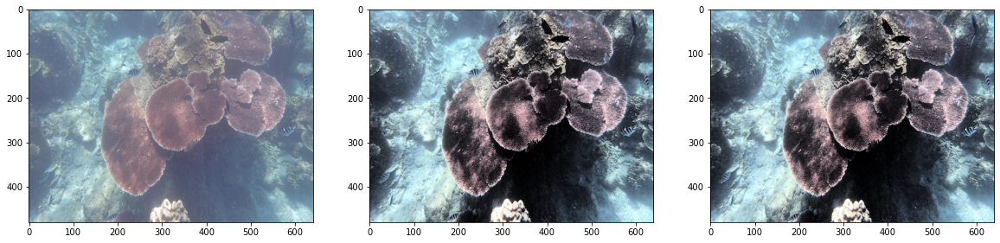

In [6]:
hsi_global_equal(image1)

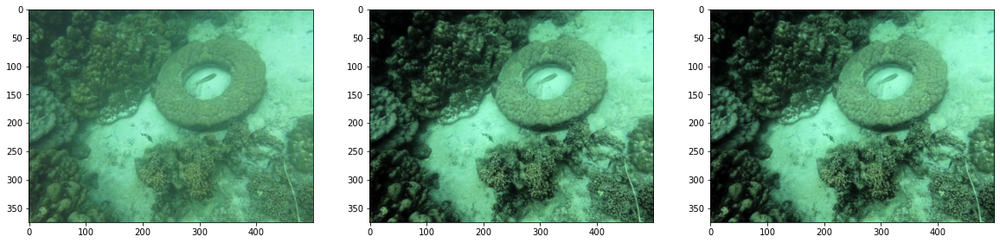

In [7]:
hsi_global_equal(image2)

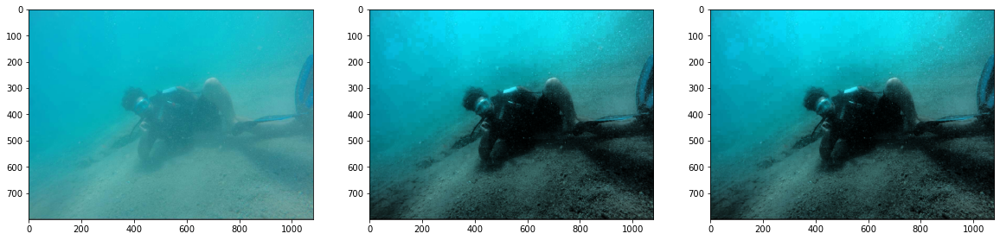

In [8]:
hsi_global_equal(image3)

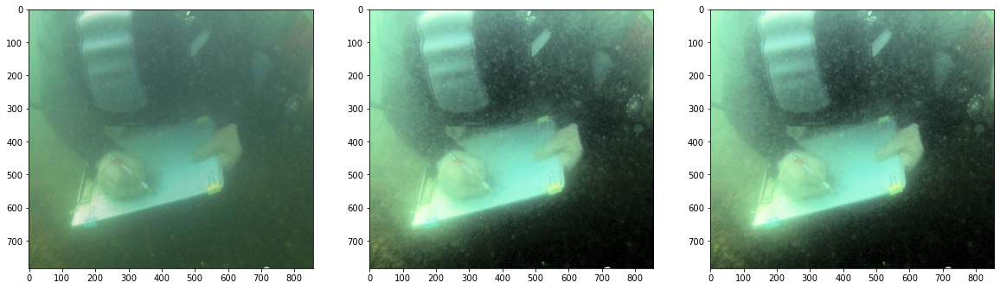

In [9]:
hsi_global_equal(image4)

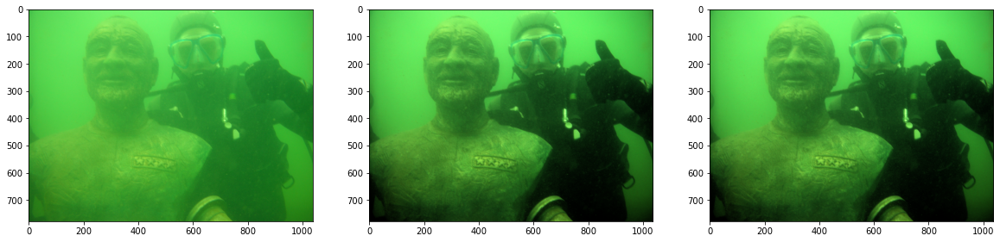

In [10]:
hsi_global_equal(image5)

# Check which channel has maximum information

In [14]:
def channel_split(image):
    imageR, imageG, imageB = image.split()

    plt.figure(figsize = (20, 20))
    
    plt.subplot(1, 4, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.subplot(1, 4, 2)
    plt.imshow(imageR)
    
    plt.subplot(1, 4, 3)
    plt.imshow(imageG) 
    
    plt.subplot(1, 4, 4)
    plt.imshow(imageB) 
    
    plt.show()

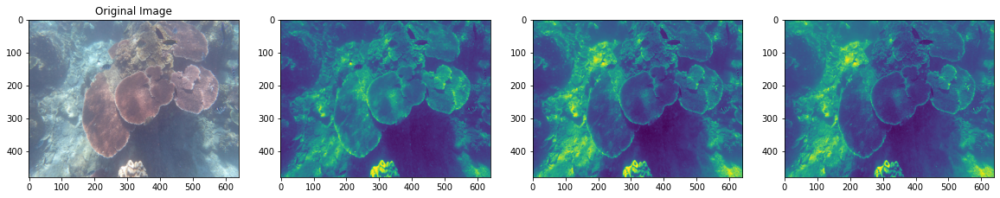

In [15]:
channel_split(image1)

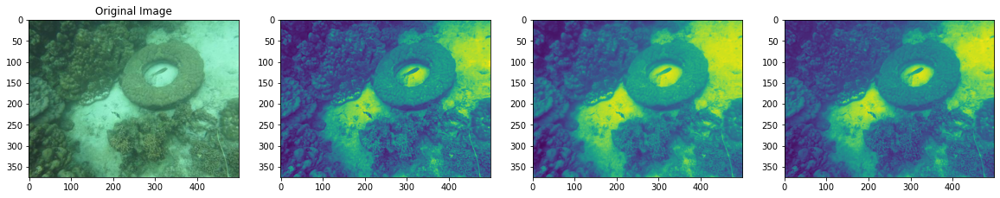

In [16]:
channel_split(image2)

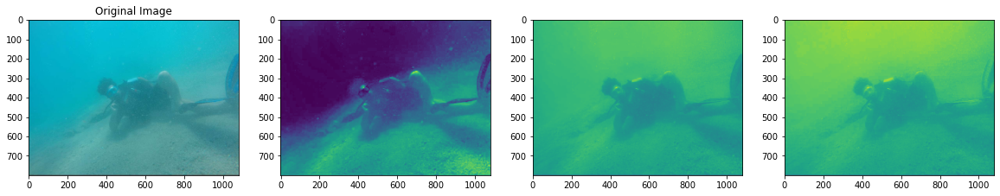

In [17]:
channel_split(image3)

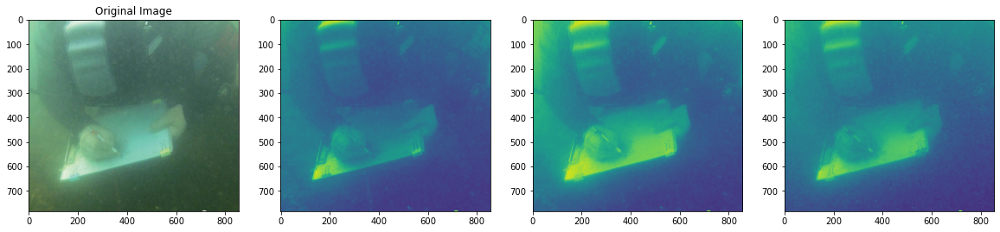

In [18]:
channel_split(image4)

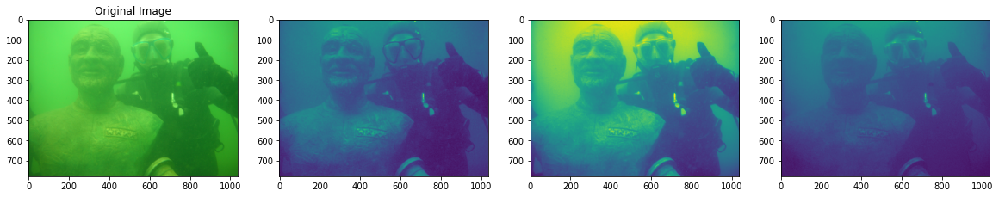

In [19]:
channel_split(image5)

## Compensating R channel

In [56]:
from PIL import Image, ImageStat
from matplotlib import pyplot as plt
import numpy as np

def compensate_R(image, alpha):
    imageR, imageG, imageB = image.split()
    
    # calculate mean of each channel
    meanR, meanG, meanB = ImageStat.Stat(image).mean
    print(meanR, meanG, meanB)
    x,y = image.size
    
    for i in range(x):
        for j in range(y):
            pixel=imageR.getpixel((i, j))
            pixelG=imageG.getpixel((i, j))
            pixel=pixel+alpha*abs(meanG-meanB)
#             print(int(pixel))
            imageR.putpixel((i, j), int(pixel))
            
    compensateIm = np.zeros((y, x, 3), dtype = "uint8")
    compensateIm[:, :, 0]= imageR;
    compensateIm[:, :, 1]= imageG;
    compensateIm[:, :, 2]= imageB;
    
    plt.figure(figsize = (20, 20))
    
    plt.subplot(1, 2, 1)
    plt.title("Original Image")
    plt.imshow(image)
    
    plt.subplot(1, 2, 2)
    plt.imshow(compensateIm) 
    
    plt.show()

64.8578495412662 172.28903079627062 56.906848904170374


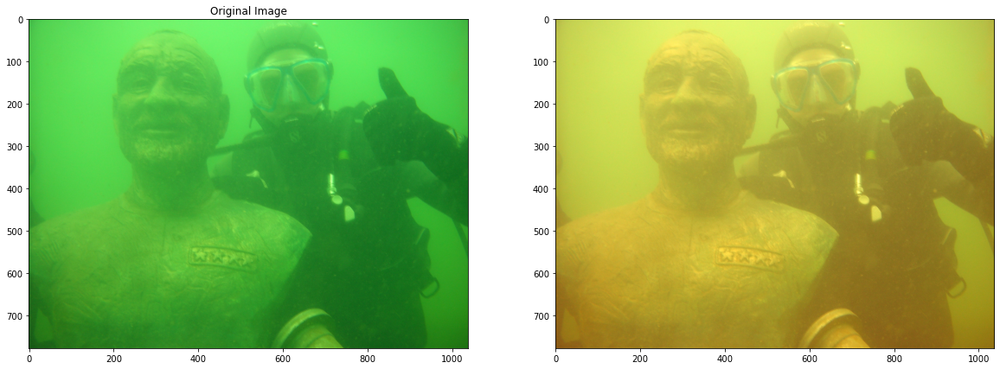

In [57]:
compensate_R(image5, 1)

84.15534846802974 125.14325145319344 102.4249919432807


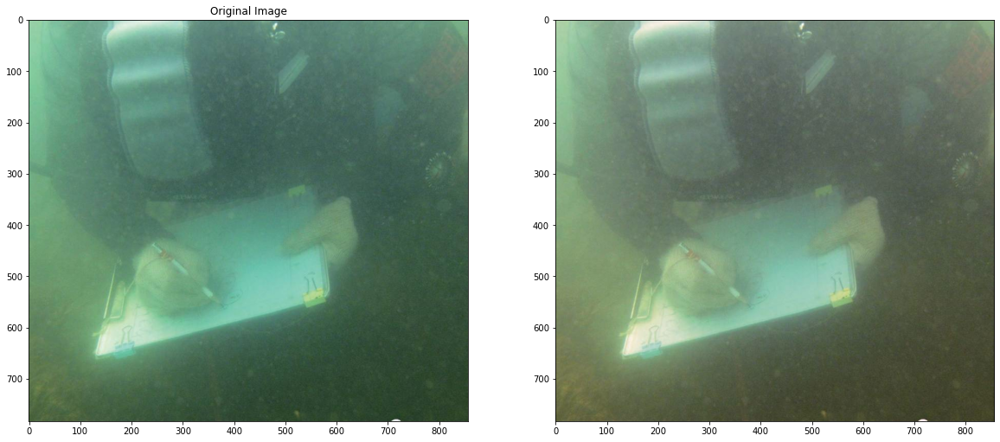

In [58]:
compensate_R(image4, 1)